# Лабораторна робота 4
## ФФ-31 мн Суханевич Олександра

## 1. Повнозв'язані нейронні мережі
### Вирішіть завдання класифікації даних, з якими ви працювали в лабораторній № 1 за допомогою повнозв’язаної нейромережі прямого поширення (fully connected feed-forward network). Результати порівняйте з одержаними раніше.

In [4]:
!pip install keras-tuner

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.1/129.1 kB 2.5 MB/s eta 0:00:00


In [12]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LeakyReLU, Dropout
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import accuracy_score
from sklearn.datasets import fetch_openml
from tensorflow.keras.regularizers import l2

# Завантаження датасету
maternal_health_risk = fetch_openml(data_id=863, as_frame=True)
X = maternal_health_risk.data
Y = maternal_health_risk.target

# Перетворення міток класів у числовий формат
label_encoder = LabelEncoder()
Y_encoded = label_encoder.fit_transform(Y)

# Розділення на тренувальні і тестові набори
X_train, X_test, y_train, y_test = train_test_split(X, Y_encoded, test_size=0.2, random_state=42)

# Нормалізація вхідних даних
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Перетворення міток на категоріальний формат (one-hot encoding)
y_train = tf.keras.utils.to_categorical(y_train)
y_test = tf.keras.utils.to_categorical(y_test)

# Побудова моделі з додатковими шарами та регуляризацією
model = Sequential([
    Dense(512, input_dim=X_train.shape[1], activation='relu', kernel_regularizer=l2(0.01)),
    Dropout(0.3),
    Dense(256, input_dim=X_train.shape[1], activation='relu', kernel_regularizer=l2(0.01)),
    Dropout(0.3),
    Dense(128, activation='relu', kernel_regularizer=l2(0.01)),
    Dropout(0.3),
    Dense(64, activation='relu', kernel_regularizer=l2(0.01)),
    Dropout(0.3),
    Dense(32, activation='relu', kernel_regularizer=l2(0.01)),
    Dropout(0.3),
    Dense(y_train.shape[1], activation='softmax')
])

# Компіляція моделі
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Налаштування ранньої зупинки
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Навчання моделі
history = model.fit(
    X_train, y_train,
    epochs=300,
    batch_size=32,
    validation_data=(X_test, y_test),
    callbacks=[early_stopping],
    verbose=1
)

# Оцінка точності на тестових даних
test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
print(f"Точність на тестових даних: {test_accuracy:.2f}")


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/300
7/7 ━━━━━━━━━━━━━━━━━━━━ 18s 258ms/step - accuracy: 0.5799 - loss: 7.0884 - val_accuracy: 0.5600 - val_loss: 6.4545
Epoch 2/300
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.5749 - loss: 6.2747 - val_accuracy: 0.6200 - val_loss: 5.7226
Epoch 3/300
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - accuracy: 0.6337 - loss: 5.5498 - val_accuracy: 0.5200 - val_loss: 5.0738
Epoch 4/300
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - accuracy: 0.6201 - loss: 4.9092 - val_accuracy: 0.5200 - val_loss: 4.5022
Epoch 5/300
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.7044 - loss: 4.3235 - val_accuracy: 0.5400 - val_loss: 4.0037
Epoch 6/300
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.6133 - loss: 3.8659 - val_accuracy: 0.5000 - val_loss: 3.5801
Epoch 7/300
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - accuracy: 0.6208 - loss: 3.4287 - val_accuracy: 0.4800 - val_loss: 3.2115
Epoch 8/300
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5928 - loss: 3.0912 - val_accuracy: 0.4400 - val_los

## Висновок: Точність методів, застосованих у роботі 1 становить 0.84 - KNN та SVM, 0.85  - Decision Tree та Random Forest і 0.74 - AdaBoost. Таким чином, дана модель перевершує лише використаний у попередній роботі метод AdaBoost.

In [ ]:
pip install tensorflow

In [6]:
!pip install ucimlrepo

# 2. Згорткові нейронні мережі
## Вирішіть завдання класифікації зображень за допомогою згорткової (convolutional) нейромережі двома способами:1.   навчить мережу з нуля (from scratch); 2.   застосуйте перенесення навчання (transfer learning from pre-trained weights). Порівняйте результати (якщо в обраному датасеті класів забагато, достатньо залишити 3-5).


In [2]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("phucthaiv02/butterfly-image-classification")

print("Path to dataset files:", path)

100%|██████████| 226M/226M [00:02<00:00, 102MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/phucthaiv02/butterfly-image-classification/versions/2


Імпортуємо датасет. Обраний набір даних
 містить 75 різних класів метеликів та близько 1000+ мічених зображень, включно з валідаційними зображеннями.
Кожне зображення належить лише до однієї категорії метеликів.
Мітки кожного зображення зберігаються у файлі Training_set.csv.

Оберемо лише 5 найпоширеніших класів метеликів у датасеті, використовуючи методи групування та фільтрації.



In [4]:
# Імпортуємо необхідні бібліотеки для роботи з даними, обробки зображень, побудови та тренування нейронних мереж
import pandas as pd
import os
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing.image import load_img, img_to_array

# Завантажуємо датасет із CSV-файлу, який містить інформацію про зображення та їх мітки
df = pd.read_csv("/root/.cache/kagglehub/datasets/phucthaiv02/butterfly-image-classification/versions/2/Training_set.csv")

# Виводимо перші 10 рядків DataFrame для ознайомлення зі структурою даних
print(df.head(10))


       filename                     label
0   Image_1.jpg          SOUTHERN DOGFACE
1   Image_2.jpg                    ADONIS
2   Image_3.jpg            BROWN SIPROETA
3   Image_4.jpg                   MONARCH
4   Image_5.jpg  GREEN CELLED CATTLEHEART
5   Image_6.jpg           CAIRNS BIRDWING
6   Image_7.jpg  GREEN CELLED CATTLEHEART
7   Image_8.jpg      EASTERN DAPPLE WHITE
8   Image_9.jpg            BROWN SIPROETA
9  Image_10.jpg               RED POSTMAN


In [5]:

# Обираємо лише 5 найпоширеніших класів метеликів
selected_classes = df['label'].value_counts().index[:5]  # Отримуємо топ-5 класів
df_filtered = df[df['label'].isin(selected_classes)]  # Фільтруємо рядки, які належать обраним класам

# Виводимо кількість зображень у кожному з обраних класів
print(df_filtered['label'].value_counts())


label
MOURNING CLOAK    131
SLEEPY ORANGE     107
ATALA             100
BROWN SIPROETA     99
CRECENT            97
Name: count, dtype: int64


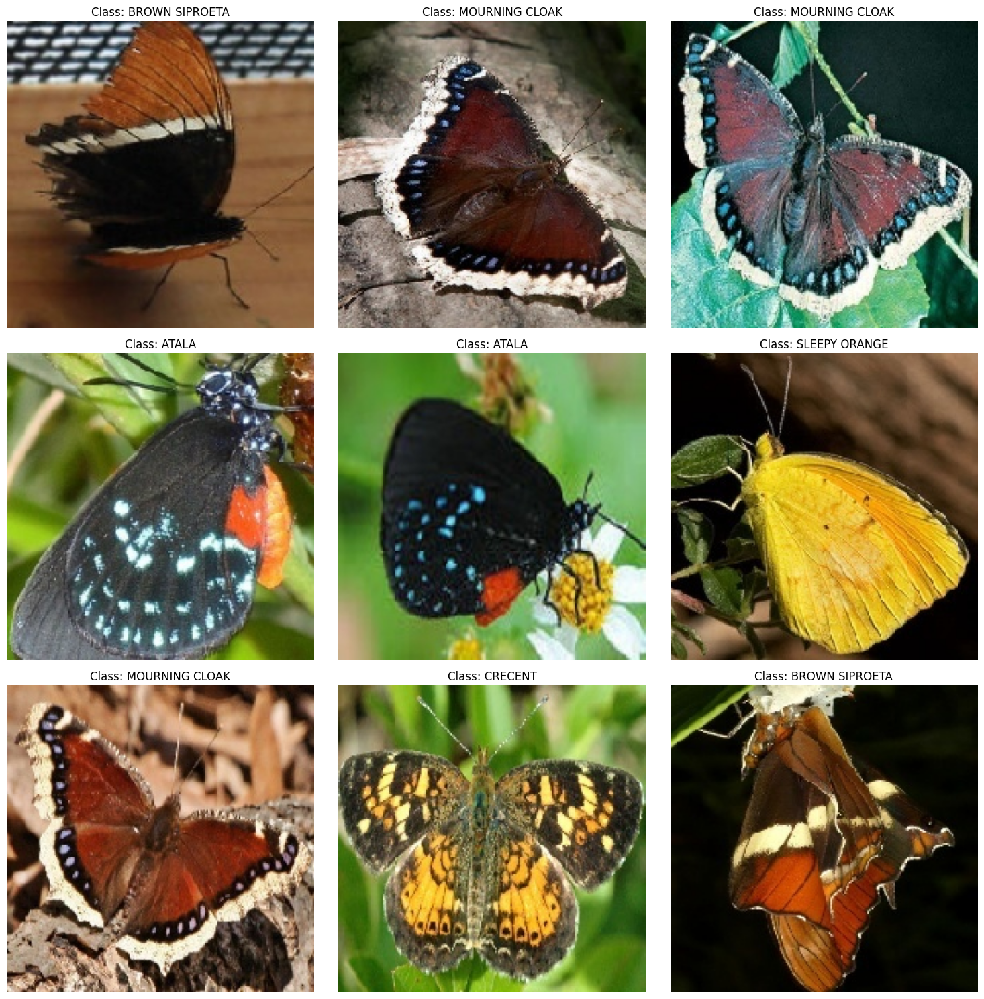

In [6]:

# Вказуємо директорію, де зберігаються зображення
image_dir = "/root/.cache/kagglehub/datasets/phucthaiv02/butterfly-image-classification/versions/2/train"

# Вибираємо випадкову підмножину зображень для візуалізації
sample_images = df_filtered.sample(9, random_state=142)

# Створюємо сітку для відображення зображень
fig, axes = plt.subplots(3, 3, figsize=(15, 15))

for i, (index, row) in enumerate(sample_images.iterrows()):  # Ітеруємося по вибраних зображеннях
    img_path = os.path.join(image_dir, row['filename'])  # Шлях до файлу
    img = load_img(img_path, target_size=(200, 200))  # Завантажуємо зображення з масштабуванням до 200x200
    img_array = img_to_array(img) / 255.0  # Перетворюємо в масив і нормалізуємо до [0, 1]

    ax = axes[i // 3, i % 3]  # Вибір відповідної підосі
    ax.imshow(img_array)  # Відображаємо зображення
    ax.set_title(f"Class: {row['label']}")  # Підписуємо клас
    ax.axis('off')  # Вимикаємо осі

plt.tight_layout()  # Оптимізуємо розміщення елементів на графіку
plt.show()


In [7]:

# Розділяємо фільтровані дані на навчальну та валідаційну вибірки (80% і 20%)
train_df, val_df = train_test_split(df_filtered, test_size=0.2, random_state=42)

# Директорія для зображень
image_dir = "/root/.cache/kagglehub/datasets/phucthaiv02/butterfly-image-classification/versions/2/train"

# Створюємо генератор даних для навчальної вибірки з аугментацією
train_datagen = ImageDataGenerator(
    rescale=1./255,  # Нормалізація
    rotation_range=40,  # Випадкове обертання
    width_shift_range=0.2,  # Зсув по ширині
    height_shift_range=0.2,  # Зсув по висоті
    shear_range=0.2,  # Зсув
    zoom_range=0.2,  # Масштабування
    horizontal_flip=True,  # Випадкове відображення по горизонталі
    fill_mode='nearest'  # Заповнення пікселями
)

# Створюємо генератор даних для валідаційної вибірки (без аугментації)
val_datagen = ImageDataGenerator(rescale=1./255)

# Створюємо генератор зображень для навчальних даних
train_generator = train_datagen.flow_from_dataframe(
    dataframe=train_df,  # Навчальна вибірка
    directory=image_dir,  # Директорія зображень
    x_col='filename',  # Колонка з іменами файлів
    y_col='label',  # Колонка з мітками
    target_size=(150, 150),  # Розмір зображення
    batch_size=32,  # Розмір партії
    class_mode='categorical',  # Категоріальна класифікація
    shuffle=True  # Перемішування даних
)

# Створюємо генератор зображень для валідаційних даних
val_generator = val_datagen.flow_from_dataframe(
    dataframe=val_df,  # Валідаційна вибірка
    directory=image_dir,
    x_col='filename',
    y_col='label',
    target_size=(150, 150),
    batch_size=32,
    class_mode='categorical',
    shuffle=False  # Дані не перемішуються
)

Found 427 validated image filenames belonging to 5 classes.
Found 107 validated image filenames belonging to 5 classes.


In [14]:

# Перевіряємо індекси класів
print("Class indices:", train_generator.class_indices)

# Імпортуємо компоненти для побудови моделі
from tensorflow.keras import layers, models

# Створюємо згорткову нейронну мережу
model_CNN = models.Sequential([
    layers.Conv2D(32, (3, 3), activation='relu', input_shape=(150, 150, 3)),  # Згортковий шар
    layers.MaxPooling2D((2, 2)),  # Шар підвибірки
    layers.Conv2D(64, (3, 3), activation='relu'),  # Другий згортковий шар
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(128, (3, 3), activation='relu'),  # Третій згортковий шар
    layers.MaxPooling2D((2, 2)),
    layers.Flatten(),  # Перетворення вектора
    layers.Dense(512, activation='relu'),  # Повнозв’язний шар
    layers.Dense(len(train_generator.class_indices), activation='softmax')  # Вихідний шар
])

# Компілюємо модель
model_CNN.compile(optimizer='adam',  # Оптимізатор
                  loss='categorical_crossentropy',  # Функція втрат
                  metrics=['accuracy'])  # Метрика точності

# Навчаємо модель
history = model_CNN.fit(
    train_generator,  # Навчальні дані
    epochs=15,  # Кількість епох
    validation_data=val_generator  # Валідаційні дані
)


Class indices: {'ATALA': 0, 'BROWN SIPROETA': 1, 'CRECENT': 2, 'MOURNING CLOAK': 3, 'SLEEPY ORANGE': 4}
Epoch 1/15
14/14 ━━━━━━━━━━━━━━━━━━━━ 34s 2s/step - accuracy: 0.2868 - loss: 2.1783 - val_accuracy: 0.5327 - val_loss: 1.1599
Epoch 2/15
14/14 ━━━━━━━━━━━━━━━━━━━━ 39s 2s/step - accuracy: 0.5512 - loss: 1.1338 - val_accuracy: 0.7103 - val_loss: 0.7367
Epoch 3/15
14/14 ━━━━━━━━━━━━━━━━━━━━ 31s 2s/step - accuracy: 0.6630 - loss: 0.8878 - val_accuracy: 0.7664 - val_loss: 0.6708
Epoch 4/15
14/14 ━━━━━━━━━━━━━━━━━━━━ 30s 2s/step - accuracy: 0.6772 - loss: 0.7365 - val_accuracy: 0.7383 - val_loss: 0.6064
Epoch 5/15
14/14 ━━━━━━━━━━━━━━━━━━━━ 43s 2s/step - accuracy: 0.7291 - loss: 0.6192 - val_accuracy: 0.7757 - val_loss: 0.5453
Epoch 6/15
14/14 ━━━━━━━━━━━━━━━━━━━━ 42s 2s/step - accuracy: 0.8062 - loss: 0.4837 - val_accuracy: 0.8318 - val_loss: 0.5296
Epoch 7/15
14/14 ━━━━━━━━━━━━━━━━━━━━ 39s 2s/step - accuracy: 0.8034 - loss: 0.5061 - val_accuracy: 0.7290 - val_loss: 0.7851
Epoch 8/15
14/

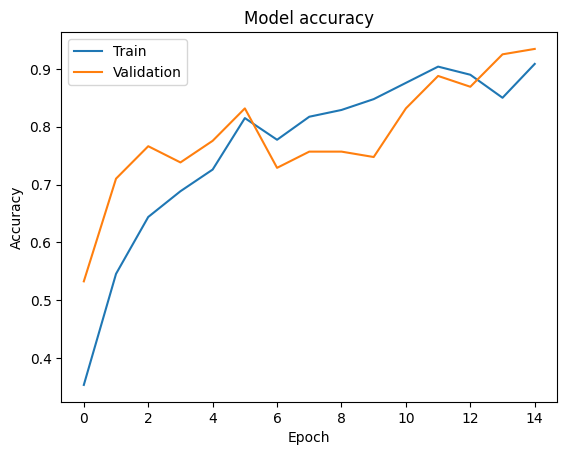

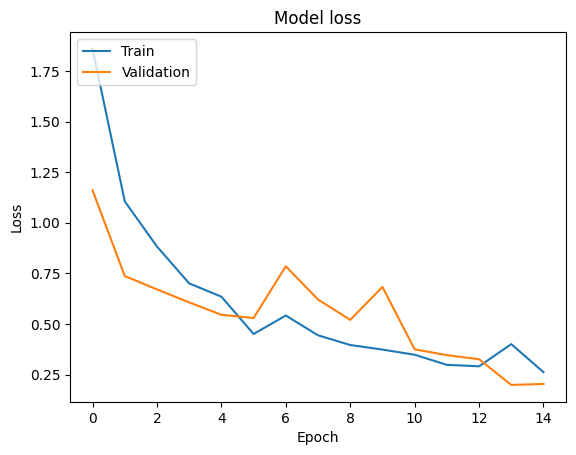

In [15]:

# Візуалізуємо тренувальну історію (точність)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# Візуалізуємо тренувальну історію (втрати)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 519ms/step


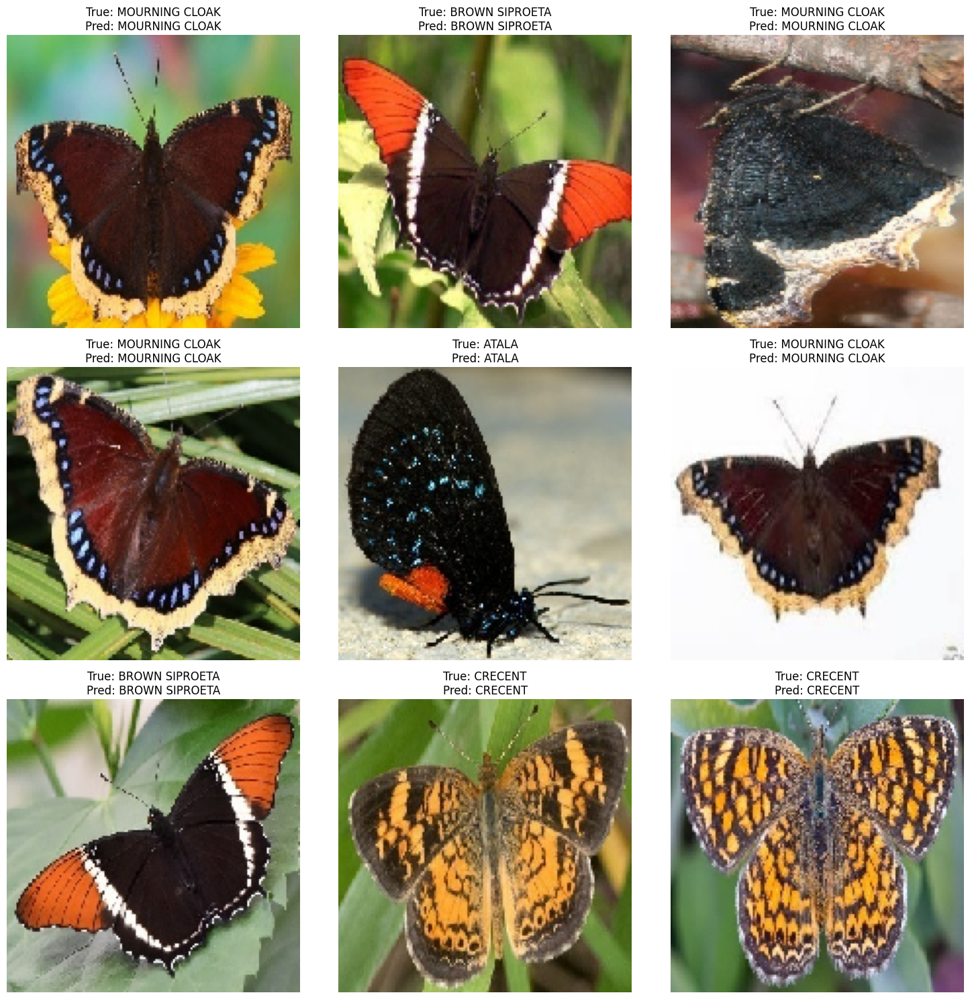

In [16]:

# Прогнозування
val_images, val_labels = next(val_generator)  # Вибір партії з валідаційних даних
pred_labels = model_CNN.predict(val_images)  # Прогнози
pred_labels = np.argmax(pred_labels, axis=1)  # Вибір класу з найвищою ймовірністю
true_labels = np.argmax(val_labels, axis=1)

# Декодування класів
class_indices = val_generator.class_indices
class_names = {v: k for k, v in class_indices.items()}

# Відображення зображень із передбаченими мітками
def display_images(images, true_labels, pred_labels, class_names, num_images=9):
    plt.figure(figsize=(15, 15))
    for i in range(num_images):
        plt.subplot(3, 3, i + 1)
        plt.imshow(images[i])
        true_label = class_names[int(true_labels[i])]
        pred_label = class_names[int(pred_labels[i])]
        plt.title(f"True: {true_label}\nPred: {pred_label}")
        plt.axis('off')
    plt.tight_layout()
    plt.show()

display_images(val_images, true_labels, pred_labels, class_names, num_images=9)


<ipython-input-18-7b7c9c7b29ca>:8: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(150, 150, 3))


Epoch 1/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 22s 987ms/step - accuracy: 0.5248 - loss: 1.7510 - val_accuracy: 0.9065 - val_loss: 0.2380
Epoch 2/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 13s 779ms/step - accuracy: 0.9277 - loss: 0.1851 - val_accuracy: 0.9439 - val_loss: 0.1167
Epoch 3/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 13s 763ms/step - accuracy: 0.9633 - loss: 0.1011 - val_accuracy: 0.9439 - val_loss: 0.1358
Epoch 4/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 21s 848ms/step - accuracy: 0.9873 - loss: 0.0439 - val_accuracy: 0.9813 - val_loss: 0.0880
Epoch 5/5
14/14 ━━━━━━━━━━━━━━━━━━━━ 14s 854ms/step - accuracy: 0.9733 - loss: 0.0632 - val_accuracy: 0.9626 - val_loss: 0.1108


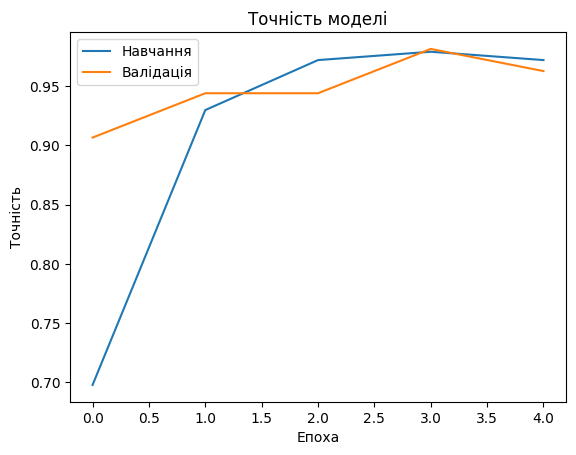

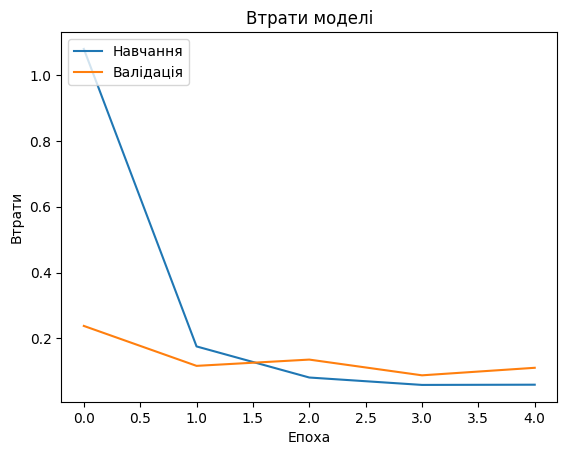

In [18]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.applications import MobileNetV2

# MobileNetV2 — це легка архітектура, оптимізована для мобільних та вбудованих пристроїв.
# 'weights=imagenet' використовує попередньо натреновані ваги з набору даних ImageNet.
# 'include_top=False' видаляє повнозв’язні шари зверху, щоб адаптувати модель до нової задачі.
base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(150, 150, 3))

# Заморожування шарів базової моделі
# Це гарантує, що попередньо натреновані ваги базової моделі залишаться незмінними під час навчання.
base_model.trainable = False

# Створення нової моделі поверх базової
model_transfer = models.Sequential([
    base_model,  # Базова модель використовується як екстрактор ознак.
    layers.GlobalAveragePooling2D(),  # Зменшує карту ознак до вектора 1D, беручи середнє по просторових розмірах.
    layers.Dense(512, activation='relu'),  # Повнозв’язний шар із 512 нейронами та активацією ReLU для вивчення нових ознак.
    layers.Dense(len(train_generator.class_indices), activation='softmax')  # Вихідний шар із кількістю нейронів, що відповідає кількості класів, з Softmax для розподілу ймовірностей.
])

# Компіляція моделі
# Оптимізатор 'adam' адаптує швидкість навчання протягом тренування.
# 'categorical_crossentropy' використовується для задач багатокласової класифікації.
model_transfer.compile(optimizer='adam',
                       loss='categorical_crossentropy',
                       metrics=['accuracy'])

# Навчання моделі
# Тренування моделі на навчальному наборі даних із перевіркою на валідаційному наборі.
history = model_transfer.fit(
    train_generator,  # Генератор навчальних даних
    epochs=5,  # Кількість епох (ітерацій по всьому набору даних)
    validation_data=val_generator  # Генератор валідаційних даних
)

# Візуалізація результатів навчання

import matplotlib.pyplot as plt

# Побудова графіка точності для навчального та валідаційного наборів
plt.plot(history.history['accuracy'])  # Точність на навчальному наборі
plt.plot(history.history['val_accuracy'])  # Точність на валідаційному наборі
plt.title('Точність моделі')
plt.ylabel('Точність')
plt.xlabel('Епоха')
plt.legend(['Навчання', 'Валідація'], loc='upper left')
plt.show()

# Побудова графіка втрат для навчального та валідаційного наборів
plt.plot(history.history['loss'])  # Втрати на навчальному наборі
plt.plot(history.history['val_loss'])  # Втрати на валідаційному наборі
plt.title('Втрати моделі')
plt.ylabel('Втрати')
plt.xlabel('Епоха')
plt.legend(['Навчання', 'Валідація'], loc='upper left')
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


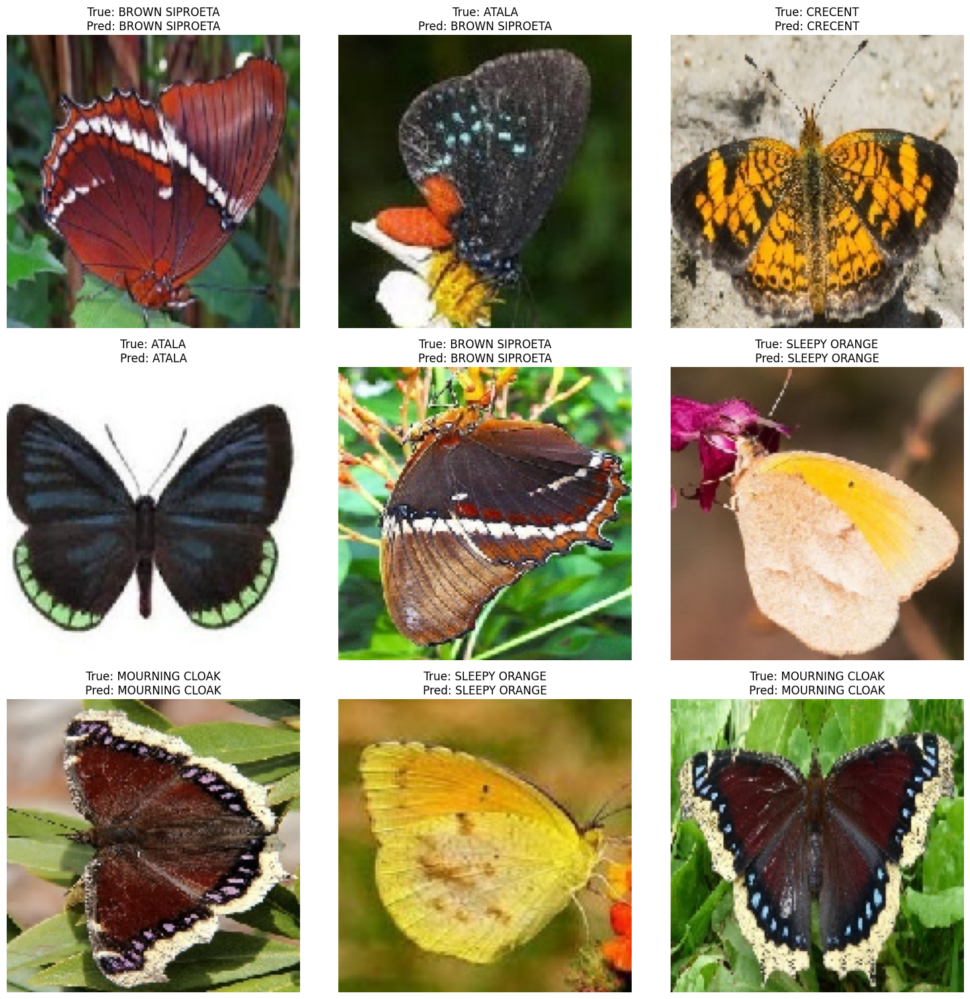

In [19]:
val_images, val_labels = next(val_generator)

pred_labels = model_CNN.predict(val_images)
pred_labels = np.argmax(pred_labels, axis=1)
true_labels = np.argmax(val_labels, axis=1)

class_indices = val_generator.class_indices
class_names = {v: k for k, v in class_indices.items()}

def display_images(images, true_labels, pred_labels, class_names, num_images=9):
    plt.figure(figsize=(15, 15))
    for i in range(num_images):
        plt.subplot(3, 3, i + 1)
        plt.imshow(images[i])
        true_label = class_names[int(true_labels[i])]
        pred_label = class_names[int(pred_labels[i])]
        plt.title(f"True: {true_label}\nPred: {pred_label}")
        plt.axis('off')
    plt.tight_layout()
    plt.show()
display_images(val_images, true_labels, pred_labels, class_names, num_images=9)

## Висновок: Модель, створена із застосуванням перенесеного навчання навчилася втричі швидше (можна навіть вважати, що їй було достатньо 2-3 епох навчення, тому в 5 разів швидше) та показала трошки вищу

In [22]:
!pip install datasets

## 3. Рекурентні нейронні мережі
### Вирішіть задачу класифікації текстів (з якими ви працювали в лабораторній № 2) за допомогою рекурентної нейромережі двома способами:а) навчить мережу і embedding шар з нуля (from scratch), б) використовуючи pretrained word embeddings
### Результати порівняйте між собою і з одержаними раніш.

In [3]:
import numpy as np
import pandas as pd
from datasets import load_dataset
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, LSTM, Dense
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
import os

# Завантаження GloVe
# os.system("wget https://nlp.stanford.edu/data/glove.6B.zip")  # Завантаження архіву

# !unzip glove.6B.zip
# Завантаження набору даних Yelp Reviews
# Набір містить тексти відгуків та їх полярність (позитивна/негативна).
yelp_reviews = load_dataset("yelp_polarity")

# Конвертація навчальних даних у pandas DataFrame для подальшої обробки
train_df = pd.DataFrame(yelp_reviews['train'])
test_df = pd.DataFrame(yelp_reviews['test'])

# Зріз навчальних та тестових даних до перших 380 рядків (для пришвидшення виконання)
train_df_cut = train_df.head(380)
test_df_cut = test_df.head(380)

# Підготовка текстів і міток (labels)
# `texts` - список текстів відгуків
# `labels` - список класів, відповідних відгукам (0 для негативних, 1 для позитивних)
texts = train_df_cut['text'].tolist()
labels = train_df_cut['label'].tolist()

# Токенізація тексту
# Токенізатор перетворює тексти в послідовності чисел, де кожне число відповідає певному слову
tokenizer = Tokenizer()
tokenizer.fit_on_texts(texts)  # Побудова словника на основі текстів
sequences = tokenizer.texts_to_sequences(texts)  # Перетворення текстів у числові послідовності

# Визначення максимальної довжини послідовності для уніфікації довжин текстів
max_len = max(len(x) for x in sequences)

# Паддінг послідовностей
# Додає нулі до послідовностей, щоб всі тексти мали однакову довжину (max_len)
X = pad_sequences(sequences, maxlen=max_len)
y = pd.get_dummies(labels).values  # Перетворення міток у формат one-hot encoding

# Завантаження GloVe embeddings
# GloVe - попередньо навчені векторні представлення слів
embeddings_index = {}
with open('glove.6B.300d.txt', encoding='utf-8') as f:
    for line in f:
        values = line.split()
        word = values[0]  # Слово
        coefs = np.asarray(values[1:], dtype='float32')  # Його векторне представлення
        embeddings_index[word] = coefs

# Створення матриці embedding
# Матриця містить векторні представлення слів зі словника токенізатора
embedding_dim = 300  # Розмірність векторів GloVe
embedding_matrix = np.zeros((len(tokenizer.word_index) + 1, embedding_dim))
for word, i in tokenizer.word_index.items():
    embedding_vector = embeddings_index.get(word)  # Отримання вектору для слова
    if embedding_vector is not None:
        embedding_matrix[i] = embedding_vector  # Додавання вектору в матрицю

# Створення моделі з попередньо навченими embeddings
model_pretrained = Sequential()  # Базова модель Sequential (послідовна структура)
model_pretrained.add(Embedding(input_dim=len(tokenizer.word_index) + 1,
                                output_dim=embedding_dim,
                                weights=[embedding_matrix],  # Використовуються попередньо навчені ваги
                                input_length=max_len,
                                trainable=False))  # Embeddings не оновлюються під час навчання
model_pretrained.add(LSTM(128))  # Додаємо LSTM шар з 128 нейронами
model_pretrained.add(Dense(y.shape[1], activation='softmax'))  # Вихідний шар для класифікації

# Компільовання моделі
# Оптимізатор: Adam (підходить для більшості завдань через адаптивну швидкість навчання)
# Функція втрат: categorical_crossentropy (підходить для багатокласової класифікації)
# Метрика: accuracy (точність моделі)
model_pretrained.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

# Навчання моделі
# Вхідні дані: X, мітки y
# epochs=10 - кількість епох навчання
# batch_size=32 - розмір пакета
# validation_split=0.2 - 20% даних для перевірки
model_pretrained.fit(X, y, epochs=15, batch_size=32, validation_split=0.2)

# Прогнозування класів на навчальних даних
predictions = model_pretrained.predict(X)
predicted_classes = np.argmax(predictions, axis=1)  # Вибір класу з найбільшою ймовірністю

# Виведення прикладів
# Виводяться тексти, реальні та передбачені класи
print("Приклади класифікації:")
for i in range(5):
    print(f"Текст: {texts[i]}")
    print(f"Реальний клас: {labels[i]}")
    print(f"Передбачений клас: {predicted_classes[i]}")
    print("-" * 50)


Epoch 1/15
10/10 ━━━━━━━━━━━━━━━━━━━━ 26s 2s/step - accuracy: 0.6014 - loss: 0.6840 - val_accuracy: 0.5000 - val_loss: 0.6991
Epoch 2/15
10/10 ━━━━━━━━━━━━━━━━━━━━ 40s 2s/step - accuracy: 0.6834 - loss: 0.5978 - val_accuracy: 0.5132 - val_loss: 0.7656
Epoch 3/15
10/10 ━━━━━━━━━━━━━━━━━━━━ 41s 2s/step - accuracy: 0.7008 - loss: 0.5419 - val_accuracy: 0.6316 - val_loss: 0.6654
Epoch 4/15
10/10 ━━━━━━━━━━━━━━━━━━━━ 41s 2s/step - accuracy: 0.8593 - loss: 0.4515 - val_accuracy: 0.5789 - val_loss: 0.7714
Epoch 5/15
10/10 ━━━━━━━━━━━━━━━━━━━━ 40s 2s/step - accuracy: 0.8223 - loss: 0.3596 - val_accuracy: 0.6711 - val_loss: 0.7753
Epoch 6/15
10/10 ━━━━━━━━━━━━━━━━━━━━ 43s 2s/step - accuracy: 0.8017 - loss: 0.4326 - val_accuracy: 0.6184 - val_loss: 0.6520
Epoch 7/15
10/10 ━━━━━━━━━━━━━━━━━━━━ 39s 2s/step - accuracy: 0.8567 - loss: 0.3820 - val_accuracy: 0.6316 - val_loss: 0.7299
Epoch 8/15
10/10 ━━━━━━━━━━━━━━━━━━━━ 38s 2s/step - accuracy: 0.8746 - loss: 0.3319 - val_accuracy: 0.6974 - val_loss:

In [34]:
# Створення моделі з нуля
model_from_scratch = Sequential()
# Шар embedding з випадковими вагами, які будуть навчені
model_from_scratch.add(Embedding(input_dim=len(tokenizer.word_index) + 1,
                                output_dim=100,  # Розмірність embedding векторів
                                input_length=max_len))  # Довжина послідовностей
# Рекурентний шар LSTM
model_from_scratch.add(LSTM(128))  # 128 одиниць в LSTM
# Шар для класифікації
model_from_scratch.add(Dense(2, activation='softmax'))  # Кількість класів = 2 (позитивний/негативний)

# Компільовання моделі
model_from_scratch.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

# Навчання моделі
model_from_scratch.fit(X, y, epochs=10, batch_size=32, validation_split=0.2)


# Прогнозування класів на навчальних даних
predictions = model_pretrained.predict(X)
predicted_classes = np.argmax(predictions, axis=1)  # Вибір класу з найбільшою ймовірністю

# Виведення прикладів
# Виводяться тексти, реальні та передбачені класи
print("Приклади класифікації:")
for i in range(5):
    print(f"Текст: {texts[i]}")
    print(f"Реальний клас: {labels[i]}")
    print(f"Передбачений клас: {predicted_classes[i]}")
    print("-" * 50)

Epoch 1/10
10/10 ━━━━━━━━━━━━━━━━━━━━ 23s 2s/step - accuracy: 0.6329 - loss: 0.6806 - val_accuracy: 0.4868 - val_loss: 0.8590
Epoch 2/10
10/10 ━━━━━━━━━━━━━━━━━━━━ 18s 2s/step - accuracy: 0.6746 - loss: 0.6165 - val_accuracy: 0.4868 - val_loss: 0.7140
Epoch 3/10
10/10 ━━━━━━━━━━━━━━━━━━━━ 20s 2s/step - accuracy: 0.6530 - loss: 0.5662 - val_accuracy: 0.4868 - val_loss: 0.8437
Epoch 4/10
10/10 ━━━━━━━━━━━━━━━━━━━━ 21s 2s/step - accuracy: 0.7470 - loss: 0.3955 - val_accuracy: 0.6053 - val_loss: 0.6099
Epoch 5/10
10/10 ━━━━━━━━━━━━━━━━━━━━ 22s 2s/step - accuracy: 0.9918 - loss: 0.2228 - val_accuracy: 0.6447 - val_loss: 1.2736
Epoch 6/10
10/10 ━━━━━━━━━━━━━━━━━━━━ 21s 2s/step - accuracy: 0.9504 - loss: 0.0998 - val_accuracy: 0.7105 - val_loss: 0.6229
Epoch 7/10
10/10 ━━━━━━━━━━━━━━━━━━━━ 22s 2s/step - accuracy: 0.9979 - loss: 0.0400 - val_accuracy: 0.6842 - val_loss: 0.7753
Epoch 8/10
10/10 ━━━━━━━━━━━━━━━━━━━━ 41s 2s/step - accuracy: 0.9953 - loss: 0.0300 - val_accuracy: 0.6579 - val_loss:

## Висновок: Моделі створеній з нуля необхідно нв третину менше часу для досягнення максимальної точності передбачень, ніж моделі, створеній із використанням pretrained word embeddings. Класифікація методом логістичної регресії, реалізована у роботі 2 має нижчу точність — 0.93 , така точність досягається обидвома створеними у даній роботі за 5 та 9 епох відповідно до послідовності реалізації моделей у роботі.